# GRAPHML-NY


Emergency response times based on the locations of emergency lines, crime locations, vehicular crashes and fire accidents with real-time traffic data.

# Install and Import Dependencies

In [64]:
%pip install osmnx  #Installing Library

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: '#Installing'
C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedWriter name=5>
  return process_handler(cmd, _system_body)
C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedReader name=8>
  return process_handler(cmd, _system_body)
C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedReader name=9>
  return process_handler(cmd, _system_body)


In [65]:
#not nessary if you have the libraries installed
%pip install matplotlib
%pip install geopandas
%pip install pandas
%pip install numpy
%pip install networkx
%pip install folium
%pip install shapely
%pip install seaborn
%pip install  momepy


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated pa

# Import

In [66]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns  
import numpy as np
import pandas as pd
import osmnx as ox
import networkx as nx
import geopandas as gpd
from shapely.geometry import Point, Polygon, box, MultiPoint
import momepy #we need this lib to easily convert gdf to nx graphs
import urllib.request
from collections import Counter

# Building the Graph

### Get City Graph

In [3]:
place_name= 'New York, United States'
G = ox.graph_from_place(place_name, network_type='drive', simplify=True) #network types: walk, drive, bike, drive_service, all, all_private

In [4]:
pcs="epsg:4326"  #project the graph from a geographic to a projected coordinates system
G=ox.project_graph(G,to_crs=pcs)

### Convert to Dataframe

In [5]:
#Retrieve nodes and edges from the graph
nodes, edges = ox.graph_to_gdfs(G)

In [6]:
#Get boundary area by a place name
boundary = ox.geocode_to_gdf(place_name)
boundary=ox.projection.project_gdf(boundary, to_crs=pcs, to_latlong=False)    

### Get Boundary

In [7]:
area = ox.geocode_to_gdf(place_name)
area

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"MULTIPOLYGON (((-74.25884 40.49887, -74.25814 ...",40.91763,40.476578,-73.700233,-74.258843,389518145,relation,175905,40.712728,-74.006015,boundary,administrative,10,0.817577,city,New York,"New York, United States"


### Plot City Graph

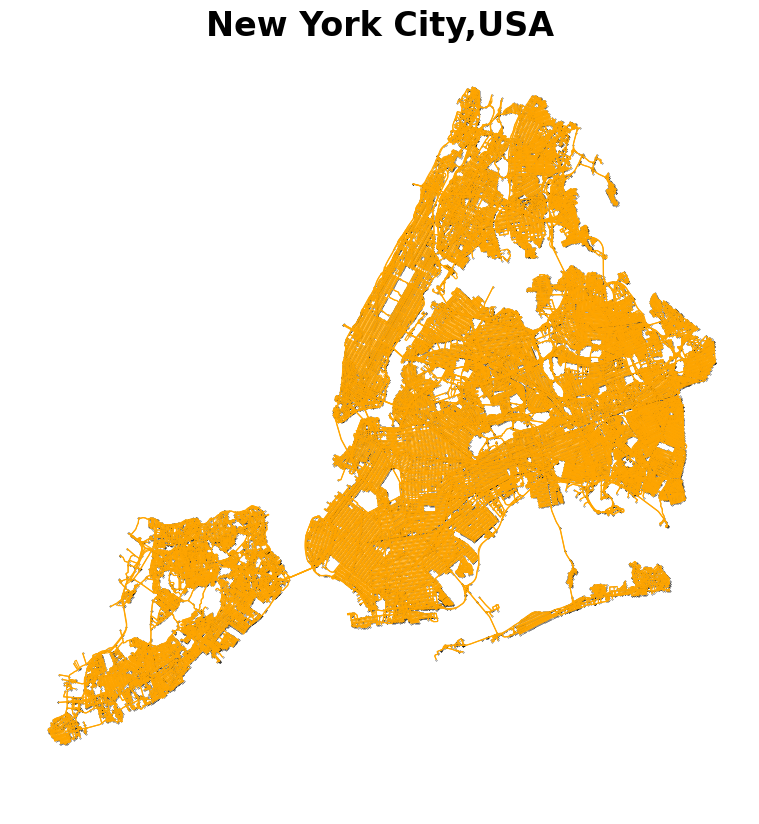

In [8]:
 #Create the plot with specified figure size
fig, ax = plt.subplots(figsize=(10, 10))

# Set the background color of the plot
area.plot(ax=ax, facecolor='White')
nodes.plot(ax=ax, color='k', markersize=0.05)
edges.plot(ax=ax, linewidth=0.8, edgecolor='orange')

# Add a title with a larger font size
plt.title("New York City,USA", fontsize=24, fontweight='bold')

# Save the plot to a file
plt.savefig('00_nyc_plot.pdf', format='pdf', bbox_inches='tight', pad_inches=0.1)
plt.axis('off')

# Show the plot
plt.show()

In [9]:
print(len(nodes)) #Number of nodes
print(len(edges)) #Number of edges

55332
139556


# Spatial Data and Graph

## Feature 1 - Emergency Lines - Amenities

### Description
Ploting all the OSM data of Emergeny line amenities like Hospital, Police station, Fire station

### Load the dataset

Plotting fire stations, ranger stations, police stations and hospitals.
https://wiki.openstreetmap.org/wiki/Map_features

In [67]:
key = "amenity" #from wiki-osm
value = ["fire_station","police","hospital"]

# Download the Points of interest
tags = {key: value}
gdf = ox.features.features_from_place(place_name, tags=tags)
print(gdf.head())

                                          geometry   amenity  \
element_type osmid                                             
node         357571909  POINT (-73.87984 40.88009)  hospital   
             357607640  POINT (-73.83883 40.84647)  hospital   
             357607688  POINT (-73.93226 40.78653)  hospital   
             357611253  POINT (-73.88140 40.88036)  hospital   
             357616245  POINT (-73.92791 40.78515)  hospital   

                                                                     name  \
element_type osmid                                                          
node         357571909  Montefiore Medical Center West Campus Moses Di...   
             357607640       New York City Children's Center Bronx Campus   
             357607688                  Kirby Forensic Psychiatric Center   
             357611253                       North Central Bronx Hospital   
             357616245               George Rosenfeld Center for Recovery   

           

In [68]:
ngdf = gdf.copy()
ngdf["geometry"] = ngdf["geometry"].centroid

C:\Users\pingn\AppData\Local\Temp\ipykernel_17240\4273497334.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ngdf["geometry"] = ngdf["geometry"].centroid


In [69]:
# Check the number of point and polygon geometries
point_count = len(ngdf[ngdf.geometry.geom_type == 'Point'])
polygon_count = len(ngdf[ngdf.geometry.geom_type == 'Polygon'])

print("Number of point geometries:", point_count)
print("Number of polygon geometries:", polygon_count)

Number of point geometries: 525
Number of polygon geometries: 0


In [70]:
# Filter out non-points geometry
ngdf_pts = ngdf.loc[ngdf.geometry.geometry.type=='Point']
ngdf_pts.shape
print(ngdf_pts.head())

                                          geometry   amenity  \
element_type osmid                                             
node         357571909  POINT (-73.87984 40.88009)  hospital   
             357607640  POINT (-73.83883 40.84647)  hospital   
             357607688  POINT (-73.93226 40.78653)  hospital   
             357611253  POINT (-73.88140 40.88036)  hospital   
             357616245  POINT (-73.92791 40.78515)  hospital   

                                                                     name  \
element_type osmid                                                          
node         357571909  Montefiore Medical Center West Campus Moses Di...   
             357607640       New York City Children's Center Bronx Campus   
             357607688                  Kirby Forensic Psychiatric Center   
             357611253                       North Central Bronx Hospital   
             357616245               George Rosenfeld Center for Recovery   

           

### Plot dataset

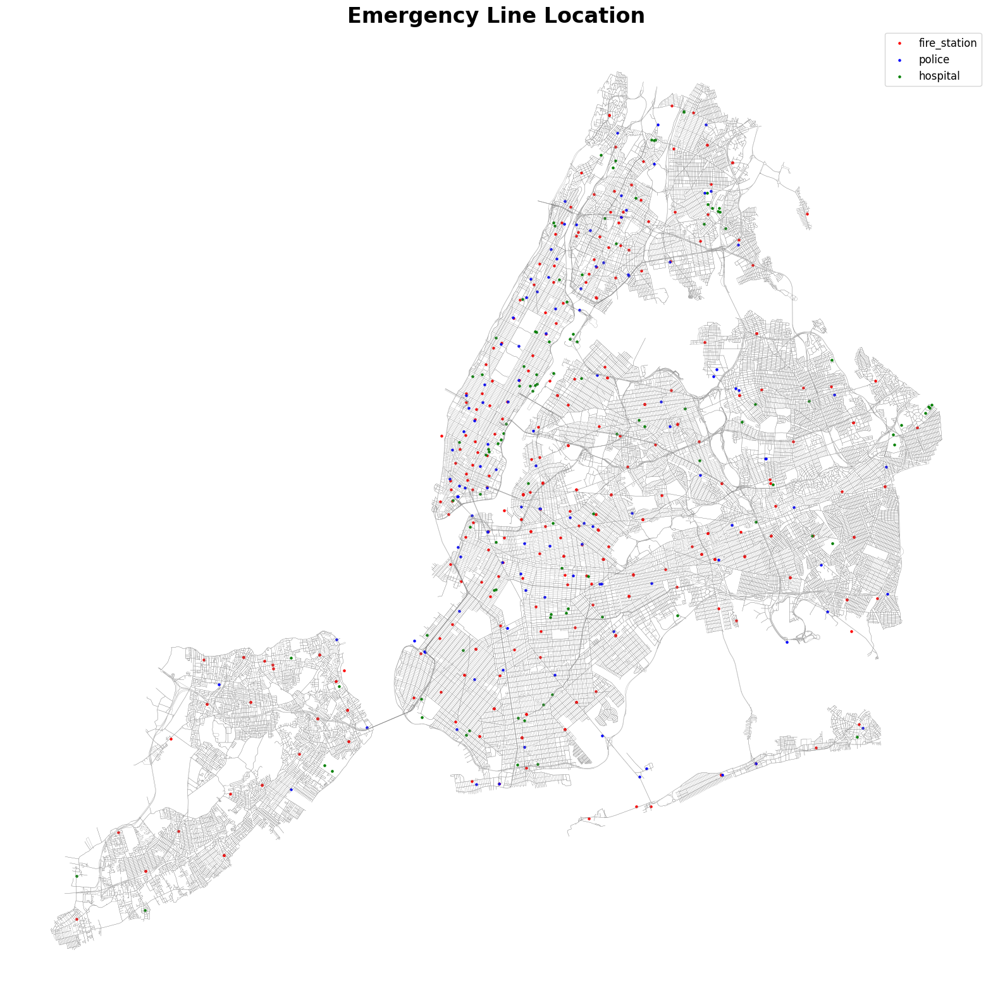

In [71]:
#Project the points to a projected coordinate system
ngdf_pts["geometry"]= ngdf_pts["geometry"].to_crs(pcs)

# Filter the POIs
filtered_gdf_fire_station = ngdf_pts[ngdf_pts['amenity'] == 'fire_station']
filtered_gdf_police = ngdf_pts[ngdf_pts['amenity'] == 'police']
filtered_gdf_hospital = ngdf_pts[ngdf_pts['amenity'] == 'hospital']

# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))

# Plot filtered POIs
filtered_gdf_fire_station.plot(ax=ax, color='red', markersize=5, label='fire_station')
filtered_gdf_police.plot(ax=ax, color='blue', markersize=5, label='police')
filtered_gdf_hospital.plot(ax=ax, color='green', markersize=5, label='hospital')

# Plot the road network
edges.plot(ax=ax, linewidth=0.2, edgecolor='grey') # print edges
plt.title("Emergency Line Location", fontsize=24, fontweight='bold')
plt.axis('off')
plt.legend(fontsize='large') 
plt.show()

### Assign data to node/edges 

Assigning the types of Amenities to the nears nodes

In [80]:
all_nodes=list(G.nodes)
len(all_nodes)

55332

In [81]:
print(f' number of nodes selected by this dataset is {len(nearest_graph_nodes_01)}')
print(f' number of unique nodes selected by this dataset is {len(Counter(nearest_graph_nodes_01)) }')

 number of nodes selected by this dataset is 525
 number of unique nodes selected by this dataset is 447


In [82]:
nodes_attributes_01= {}

for i,j in zip(nearest_graph_nodes_01, E_buildings['emergency_type']):
      
      if i not in nodes_attributes_01.keys():
        nodes_attributes_01[i] = [0,0,0]     #initialize a list of four items for the categories

        for k,z in enumerate(unique_emergency):
          if j == z:
            nodes_attributes_01[i][k]=1   #try z instead of 1 to check the index 1 is placed in is correct

#check the dict structure
print(len(nodes_attributes_01))

{i: nodes_attributes_01[i] for i in list(nodes_attributes_01)}

447


{42756049: [1, 0, 0],
 4639095748: [1, 0, 0],
 3037017931: [1, 0, 0],
 42750225: [1, 0, 0],
 740060236: [1, 0, 0],
 2545719718: [1, 0, 0],
 42439073: [1, 0, 0],
 42428013: [1, 0, 0],
 371188320: [1, 0, 0],
 42440737: [1, 0, 0],
 42431656: [1, 0, 0],
 277767242: [1, 0, 0],
 42750031: [0, 1, 0],
 1579630833: [0, 1, 0],
 42745350: [0, 1, 0],
 42737719: [0, 1, 0],
 42949392: [0, 1, 0],
 5609962110: [0, 1, 0],
 42966437: [0, 1, 0],
 42971559: [0, 1, 0],
 42959377: [0, 1, 0],
 42964552: [0, 1, 0],
 42986987: [0, 1, 0],
 42972533: [0, 1, 0],
 42968991: [0, 1, 0],
 42970379: [0, 1, 0],
 42990248: [0, 1, 0],
 42950558: [0, 1, 0],
 42964675: [0, 1, 0],
 42769660: [0, 1, 0],
 1579630668: [0, 1, 0],
 42731755: [0, 1, 0],
 42718689: [0, 1, 0],
 42890024: [0, 1, 0],
 274301551: [0, 1, 0],
 42874754: [0, 1, 0],
 42837808: [0, 1, 0],
 42823778: [0, 1, 0],
 42836703: [0, 1, 0],
 277787655: [0, 1, 0],
 7762112549: [0, 1, 0],
 42817949: [0, 1, 0],
 42843612: [0, 1, 0],
 42918782: [0, 1, 0],
 42822333: [0

In [83]:
#now add to this dictionary the other unselected nodes with value = [0,0,0]
unsellected_nodes_01= np.setdiff1d(all_nodes,nearest_graph_nodes_01) #check the nodes that exist in all_nodes but not in the nearest_graph_nodes
unsellected_nodes_01=unsellected_nodes_01.tolist()
[nodes_attributes_01.update({i: [0,0,0]}) for i in unsellected_nodes_01]
print(len(unsellected_nodes_01))
print(len(nodes_attributes_01))      #has to be the same number of graph nodes


54885
55332


## Feature 2  - Crime Locations

### Description
All valid felony, misdemeanor, and violation crimes reported to the New York City Police Department (NYPD). 

URL = https://data.cityofnewyork.us/Public-Safety/NYPD-Complaint-Data-Current-Year-To-Date-/5uac-w243/about_data

### Load the dataset

In [94]:
url="https://raw.githubusercontent.com/NaveenKumar-ar/GraphML_Repo/main/02-Datasets/Crime%20data/NYPD_Complaint_Data_Current__Year_To_Date__20240522.csv"
crime_df = pd.read_csv(url)
print(crime_df.head())

  CMPLNT_NUM  ADDR_PCT_CD    BORO_NM CMPLNT_FR_DT CMPLNT_FR_TM CMPLNT_TO_DT  \
0  282536052           79   BROOKLYN   02/15/2024     07:20:00          NaN   
1  282805297           42      BRONX   02/25/2024     12:24:00          NaN   
2  280611665          105     QUEENS   01/16/2024     08:00:00   01/16/2024   
3  284354345           68   BROOKLYN   03/25/2024     11:16:00   03/25/2024   
4  282082987           17  MANHATTAN   02/12/2024     12:35:00   02/12/2024   

  CMPLNT_TO_TM CRM_ATPT_CPTD_CD HADEVELOPT  HOUSING_PSA  ...  \
0       (null)        COMPLETED     (null)          NaN  ...   
1       (null)        COMPLETED     (null)          NaN  ...   
2     08:10:00        COMPLETED     (null)          NaN  ...   
3     16:00:00        COMPLETED     (null)          NaN  ...   
4     12:40:00        COMPLETED     (null)          NaN  ...   

   TRANSIT_DISTRICT VIC_AGE_GROUP                  VIC_RACE VIC_SEX  \
0               NaN           <18                   UNKNOWN       F  

C:\Users\pingn\AppData\Local\Temp\ipykernel_17240\565868351.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  crime_df = pd.read_csv(url)


In [95]:
geometry = gpd.points_from_xy(crime_df['Longitude'], crime_df['Latitude'])
crime_gdf = gpd.GeoDataFrame(crime_df, geometry=geometry)
crime_gdf.set_crs(epsg=4326, inplace=True)

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,HOUSING_PSA,...,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,geometry
0,282536052,79,BROOKLYN,02/15/2024,07:20:00,NaN,(null),COMPLETED,(null),NaN,...,<18,UNKNOWN,F,999496.0,190300.0,40.689001,-73.945027,"(40.68900139556, -73.9450265328727)",POINT (-73.9450265328727 40.68900139556),POINT (-73.94503 40.68900)
1,282805297,42,BRONX,02/25/2024,12:24:00,NaN,(null),COMPLETED,(null),NaN,...,45-64,BLACK,M,1013401.0,241248.0,40.828800,-73.894664,"(40.8288, -73.894664)",POINT (-73.894664 40.8288),POINT (-73.89466 40.82880)
2,280611665,105,QUEENS,01/16/2024,08:00:00,01/16/2024,08:10:00,COMPLETED,(null),NaN,...,65+,WHITE,M,1062950.0,205790.0,40.731173,-73.716036,"(40.731173, -73.716036)",POINT (-73.716036 40.731173),POINT (-73.71604 40.73117)
3,284354345,68,BROOKLYN,03/25/2024,11:16:00,03/25/2024,16:00:00,COMPLETED,(null),NaN,...,45-64,ASIAN / PACIFIC ISLANDER,M,980639.0,170223.0,40.633899,-74.013008,"(40.633899, -74.013008)",POINT (-74.013008 40.633899),POINT (-74.01301 40.63390)
4,282082987,17,MANHATTAN,02/12/2024,12:35:00,02/12/2024,12:40:00,COMPLETED,(null),NaN,...,UNKNOWN,UNKNOWN,D,992155.0,213560.0,40.752848,-73.971465,"(40.752848, -73.971465)",POINT (-73.971465 40.752848),POINT (-73.97146 40.75285)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137265,280690770,43,BRONX,01/16/2024,14:00:00,NaN,(null),COMPLETED,(null),NaN,...,25-44,WHITE HISPANIC,M,1021490.0,236441.0,40.815576,-73.865461,"(40.815576, -73.865461)",POINT (-73.865461 40.815576),POINT (-73.86546 40.81558)
137266,280023750,113,QUEENS,01/05/2024,13:00:00,01/05/2024,13:05:00,COMPLETED,(null),NaN,...,UNKNOWN,UNKNOWN,L,1043033.0,184543.0,40.673009,-73.788088,"(40.673009453858576, -73.78808751750873)",POINT (-73.78808751750873 40.673009453858576),POINT (-73.78809 40.67301)
137267,282534312,103,QUEENS,02/20/2024,20:00:00,02/20/2024,20:15:00,COMPLETED,(null),NaN,...,45-64,BLACK,F,1042569.0,198302.0,40.710779,-73.789640,"(40.710779, -73.78964)",POINT (-73.78964 40.710779),POINT (-73.78964 40.71078)
137268,282056402,112,QUEENS,02/11/2024,03:00:00,02/11/2024,07:00:00,COMPLETED,(null),NaN,...,25-44,WHITE HISPANIC,M,1025005.0,203505.0,40.725159,-73.852961,"(40.725159, -73.852961)",POINT (-73.852961 40.725159),POINT (-73.85296 40.72516)


In [100]:
#fitering points only
crime_gdf_points = crime_gdf[crime_gdf['geometry'].type == 'Point']
crime_df = crime_gdf.dropna(subset=['geometry'])
crime_gdf_points.head()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,HOUSING_PSA,...,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,geometry
0,282536052,79,BROOKLYN,02/15/2024,07:20:00,NaN,(null),COMPLETED,(null),NaN,...,<18,UNKNOWN,F,999496.0,190300.0,40.689001,-73.945027,"(40.68900139556, -73.9450265328727)",POINT (-73.9450265328727 40.68900139556),POINT (-73.94503 40.68900)
1,282805297,42,BRONX,02/25/2024,12:24:00,NaN,(null),COMPLETED,(null),NaN,...,45-64,BLACK,M,1013401.0,241248.0,40.828800,-73.894664,"(40.8288, -73.894664)",POINT (-73.894664 40.8288),POINT (-73.89466 40.82880)
2,280611665,105,QUEENS,01/16/2024,08:00:00,01/16/2024,08:10:00,COMPLETED,(null),NaN,...,65+,WHITE,M,1062950.0,205790.0,40.731173,-73.716036,"(40.731173, -73.716036)",POINT (-73.716036 40.731173),POINT (-73.71604 40.73117)
3,284354345,68,BROOKLYN,03/25/2024,11:16:00,03/25/2024,16:00:00,COMPLETED,(null),NaN,...,45-64,ASIAN / PACIFIC ISLANDER,M,980639.0,170223.0,40.633899,-74.013008,"(40.633899, -74.013008)",POINT (-74.013008 40.633899),POINT (-74.01301 40.63390)
4,282082987,17,MANHATTAN,02/12/2024,12:35:00,02/12/2024,12:40:00,COMPLETED,(null),NaN,...,UNKNOWN,UNKNOWN,D,992155.0,213560.0,40.752848,-73.971465,"(40.752848, -73.971465)",POINT (-73.971465 40.752848),POINT (-73.97146 40.75285)


In [101]:
#check for duplicates
print(crime_gdf_points.duplicated(subset=['geometry']).sum())

# Check the number of point and polygon geometries
point_count = len(crime_gdf_points[crime_gdf_points.geometry.geom_type == 'Point'])
polygon_count = len(crime_gdf_points[crime_gdf_points.geometry.geom_type == 'Polygon'])

print("Number of point geometries:", point_count)
print("Number of polygon geometries:", polygon_count)

96674
Number of point geometries: 137270
Number of polygon geometries: 0


### Plot dataset

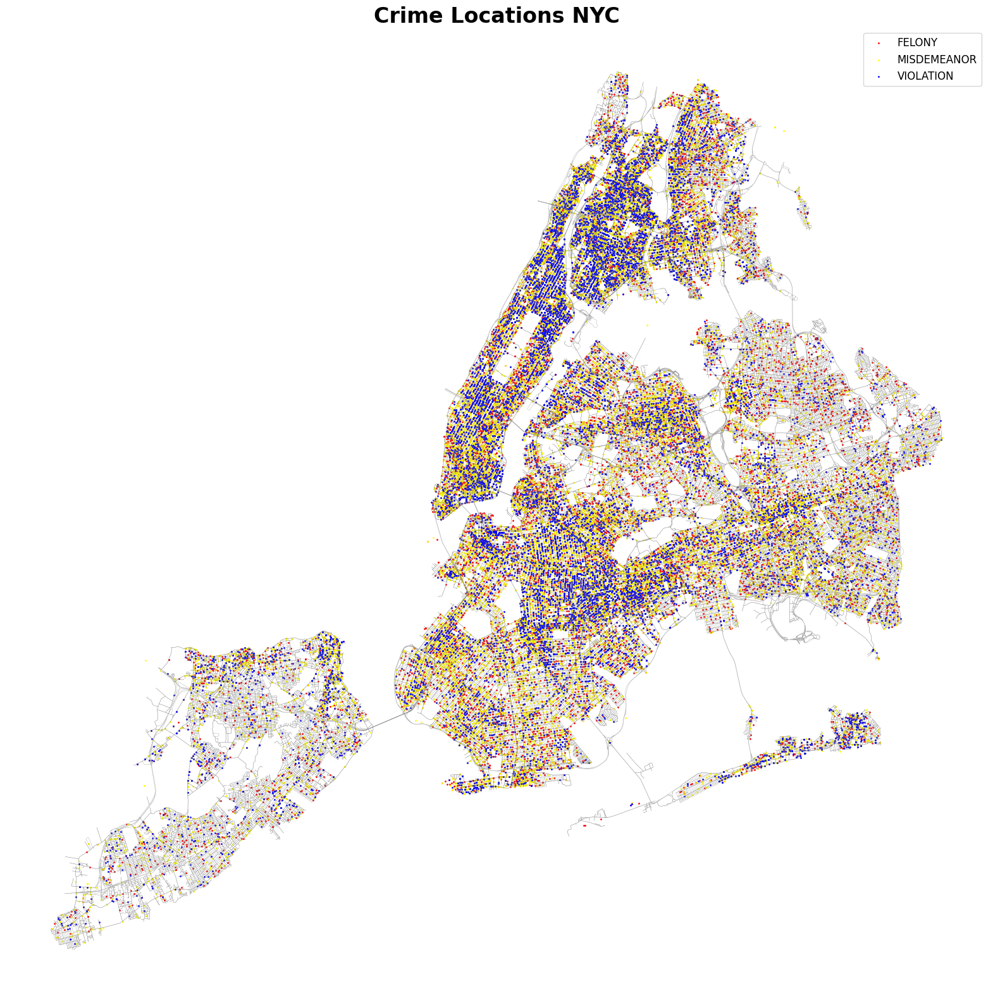

In [ ]:
#Project the points to a projected coordinate system
crime_gdf_points["geometry"]= crime_gdf_points["geometry"].to_crs(pcs)

#classifying the crime types
crime_felony = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'FELONY']
crime_misdemeanor = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'MISDEMEANOR']
crime_violation = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'VIOLATION']

# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))

# Plot filtered POIs
crime_felony.plot(ax=ax, color='red', markersize=1, label='FELONY')
crime_misdemeanor.plot(ax=ax, color='yellow', markersize=1, label='MISDEMEANOR')
crime_violation.plot(ax=ax, color='blue', markersize=1, label='VIOLATION')

edges.plot(ax=ax, linewidth=0.2, edgecolor='grey') # print edges
plt.title("Crime Locations NYC",  fontsize=24, fontweight='bold')
plt.axis('off')
plt.legend(fontsize='large')
plt.show()

### 01

In [ ]:
close_edges = ox.distance.nearest_edges(G, crime_gdf_points['geometry'].x, crime_gdf_points['geometry'].y)
crime_count = Counter(close_edges)

In [ ]:
crimes = []

for i in edges.index:
    # Retrieve the number of crashes for the edge at position i
    crime = crime_count[edges.loc[i].name]
    crimes.append(crime)

max_crashes = max(crimes)
edges['crimes'] = crimes

In [ ]:
log_weights = np.log(edges['crimes']+1)
normalized_crimes = (log_weights - log_weights.min()) / (log_weights.max() - log_weights.min())

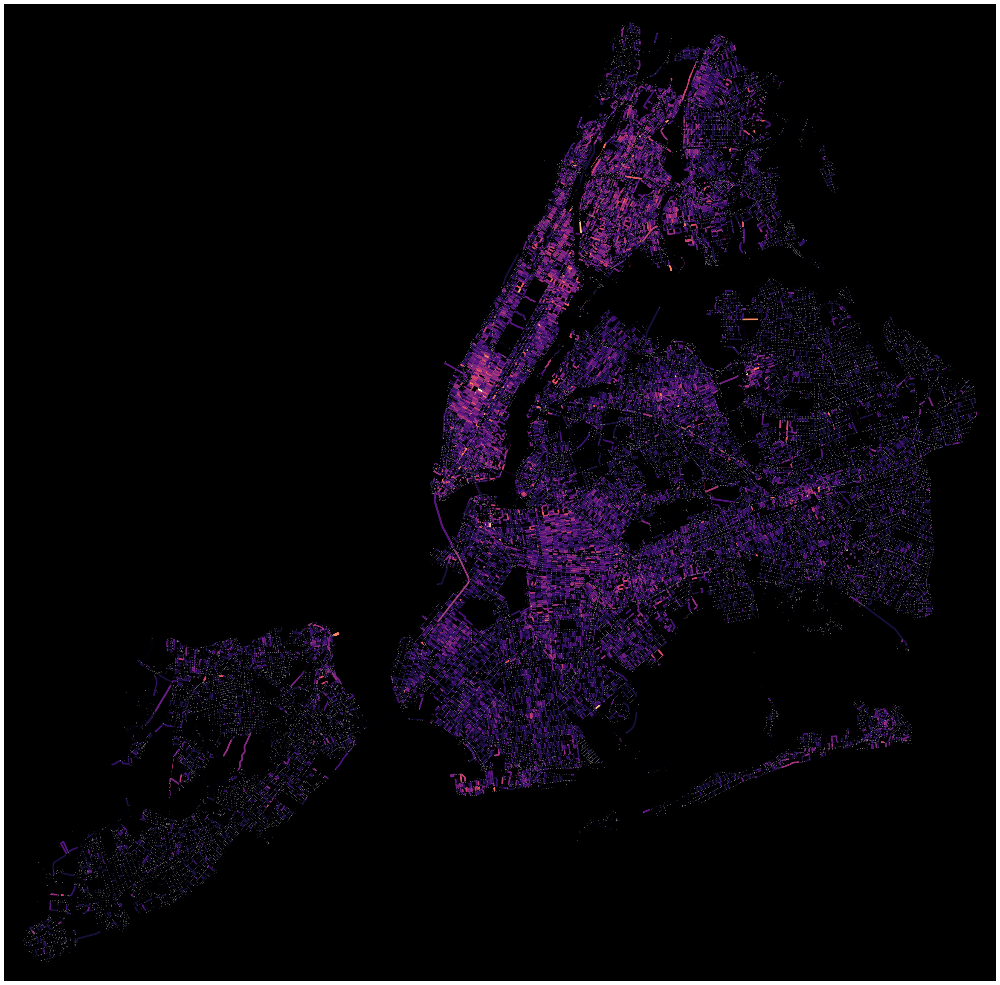

In [ ]:
edges['normalized crime'] = normalized_crimes

G = ox.graph_from_gdfs(nodes, edges)
ec = ox.plot.get_edge_colors_by_attr(G, attr = 'normalized crime', cmap= 'magma')

fig, ax = ox.plot_graph(G, node_size=1, node_color = 'grey', edge_color=ec, edge_linewidth=3, figsize=(30,30), edge_alpha=1, bgcolor='black')

## Feature 3 - Vehicular Crashes

### Description
Serious vehicular crashes that were analyzed and reported on as part of SIRTA.

URL = https://data.cityofnewyork.us/Transportation/Serious-Injury-Response-Tracking-Analysis-Program-/xeqp-qz8h/about_data

### Load the dataset

In [29]:
url ="https://raw.githubusercontent.com/NaveenKumar-ar/GraphML_Repo/main/02-Datasets/accidents/Serious_Injury_Response__Tracking___Analysis_Program__SIRTA__20240521.csv"
vehicular_crashes = pd.read_csv(url)
print(vehicular_crashes.head())

   Collision ID  Crash Date Crash Time  Crash Police Precinct Crash Borough  \
0     4492364.0  01-01-2022       1:28                   46.0         Bronx   
1     4491159.0  01-01-2022       4:33                   46.0         Bronx   
2     4491487.0  01-01-2022       5:55                   47.0         Bronx   
3     4491223.0  01-01-2022      10:42                   43.0         Bronx   
4     4491418.0  01-01-2022      20:55                   49.0         Bronx   

   Total Non-Severe Injuries  Total Severe Injuries  Total Fatalities  \
0                        1.0                    1.0               0.0   
1                        0.0                    1.0               0.0   
2                        0.0                    1.0               0.0   
3                        0.0                    1.0               0.0   
4                        0.0                    1.0               0.0   

    Latitude  Longitude  ... Highway Reference Marker ZipCode  \
0  40.858707  -73.903

In [30]:
# Create a GeoDataFrame from the vehicular crashes DataFrame
geometry = gpd.points_from_xy(vehicular_crashes['Longitude'], vehicular_crashes['Latitude'])
crashes_gdf = gpd.GeoDataFrame(vehicular_crashes, geometry=geometry)
crashes_gdf.set_crs(epsg=4326, inplace=True)

,Collision ID,Crash Date,Crash Time,Crash Police Precinct,Crash Borough,Total Non-Severe Injuries,Total Severe Injuries,Total Fatalities,Latitude,Longitude,...,ZipCode,Similar Fatalities & Severe Injuries (3Y Lookback),Similar Fatalities & All Injuries (3Y Lookback),Community Board,Council District,Building Identification Number (BIN),Borough Block Lot (BBL),Census Tract (2020),Neighborhood Tabulation Area (NTA) (2020),geometry
0,4492364.0,01-01-2022,1:28,46.0,Bronx,1.0,1.0,0.0,40.858707,-73.90370,...,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.90370 40.85871)
1,4491159.0,01-01-2022,4:33,46.0,Bronx,0.0,1.0,0.0,NaN,NaN,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT EMPTY
2,4491487.0,01-01-2022,5:55,47.0,Bronx,0.0,1.0,0.0,40.871550,-73.86428,...,NaN,0.0,0.0,212.0,12.0,2056281.0,2.045980e+09,372.0,BX1201,POINT (-73.86428 40.87155)
3,4491223.0,01-01-2022,10:42,43.0,Bronx,0.0,1.0,0.0,40.823673,-73.87233,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.87233 40.82367)
4,4491418.0,01-01-2022,20:55,49.0,Bronx,0.0,1.0,0.0,40.863945,-73.86452,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.86452 40.86395)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5136,4670978.0,09/29/2023,0:02,45.0,Bronx,0.0,1.0,0.0,40.838345,-73.84650,...,10461.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.84650 40.83834)
5137,4671179.0,09/16/2023,14:08,40.0,Bronx,0.0,1.0,0.0,40.804585,-73.91213,...,NaN,0.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.91213 40.80459)
5138,4671610.0,09/29/2023,7:46,44.0,Bronx,0.0,1.0,0.0,40.839222,-73.91510,...,10452.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.91510 40.83922)
5139,4672556.0,09-11-2023,19:00,42.0,Bronx,0.0,1.0,0.0,40.822575,-73.90321,...,10456.0,0.0,2.0,203.0,17.0,2091959.0,2.026380e+09,133.0,BX0301,POINT (-73.90321 40.82258)


In [31]:
#fitering points only
crashes_gdf_points = crashes_gdf[crashes_gdf['geometry'].type == 'Point']
crashes_gdf = crashes_gdf.dropna(subset=['geometry'])

In [166]:
# Define the function to classify the type of crash
def classify_crash(row):
    if row['Total Fatalities'] > 0:
        return '3C'
    elif row['Total Severe Injuries'] > 0:
        return '2C'
    else:
        return '1C'

# Apply the function to create the 'Type of crash' column
crashes_gdf_points['Type of crash'] = crashes_gdf_points.apply(classify_crash, axis=1)

# Count the number of each type of crash
crashes_gdf_points['Type of crash'].value_counts()

Type of crash
2C    4714
3C     415
1C      12
Name: count, dtype: int64

In [33]:
# Check the number of point and polygon geometries
point_count = len(crashes_gdf_points[crashes_gdf_points.geometry.geom_type == 'Point'])
polygon_count = len(crashes_gdf_points[crashes_gdf_points.geometry.geom_type == 'Polygon'])

print("Number of point geometries:", point_count)
print("Number of polygon geometries:", polygon_count)

Number of point geometries: 5141
Number of polygon geometries: 0


### Plot dataset

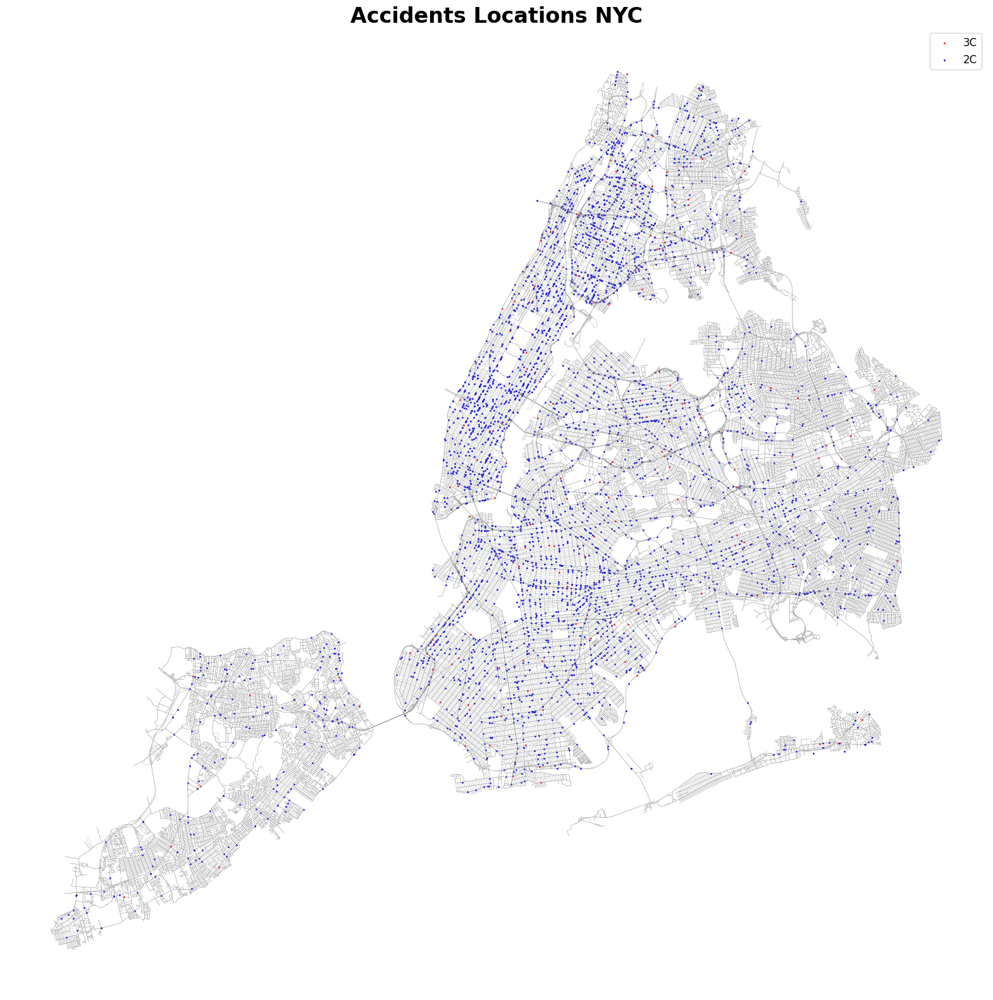

In [34]:
#Project the points to a projected coordinate system
crashes_gdf_points["geometry"]= crashes_gdf_points["geometry"].to_crs(pcs)

#classifying the crime types
TF= crashes_gdf_points[crashes_gdf_points['Type of crash'] == '3C']
TS = crashes_gdf_points[crashes_gdf_points['Type of crash'] == '2C']
Total_Non_Severe_Injuries = crashes_gdf_points[crashes_gdf_points['Type of crash'] == '1C']

# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))

# Plot filtered POIs
TF.plot(ax=ax, color='red', markersize=1, label='3C')
TS.plot(ax=ax, color='blue', markersize=1, label='2C')

edges.plot(ax=ax, linewidth=0.2, edgecolor='grey') # print edges
plt.title("Accidents Locations NYC",  fontsize=24, fontweight='bold')
plt.axis('off')
plt.legend(fontsize='large')
plt.show()

### 03

In [35]:
crashes_gdf = crashes_gdf[~crashes_gdf['geometry'].is_empty]
crashes_gdf = crashes_gdf[~crashes_gdf['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
crashes_gdf.head()

,Collision ID,Crash Date,Crash Time,Crash Police Precinct,Crash Borough,Total Non-Severe Injuries,Total Severe Injuries,Total Fatalities,Latitude,Longitude,...,ZipCode,Similar Fatalities & Severe Injuries (3Y Lookback),Similar Fatalities & All Injuries (3Y Lookback),Community Board,Council District,Building Identification Number (BIN),Borough Block Lot (BBL),Census Tract (2020),Neighborhood Tabulation Area (NTA) (2020),geometry
0,4492364.0,01-01-2022,1:28,46.0,Bronx,1.0,1.0,0.0,40.858707,-73.90370,...,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.90370 40.85871)
2,4491487.0,01-01-2022,5:55,47.0,Bronx,0.0,1.0,0.0,40.871550,-73.86428,...,NaN,0.0,0.0,212.0,12.0,2056281.0,2.045980e+09,372.0,BX1201,POINT (-73.86428 40.87155)
3,4491223.0,01-01-2022,10:42,43.0,Bronx,0.0,1.0,0.0,40.823673,-73.87233,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.87233 40.82367)
4,4491418.0,01-01-2022,20:55,49.0,Bronx,0.0,1.0,0.0,40.863945,-73.86452,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.86452 40.86395)
6,4491529.0,01-02-2022,1:22,52.0,Bronx,0.0,0.0,1.0,40.882217,-73.88046,...,NaN,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.88046 40.88222)


In [36]:
close_edges = ox.distance.nearest_edges(G, crashes_gdf['geometry'].x, crashes_gdf['geometry'].y)
crash_count = Counter(close_edges)

In [37]:
crashes = []

for i in edges.index:
    # Retrieve the number of crashes for the edge at position i
    crash = crash_count[edges.loc[i].name]
    crashes.append(crash)

max_crashes = max(crashes)
edges['crashes'] = crashes

In [38]:
log_weights = np.log(edges['crashes']+1)
normalized_crashes = (log_weights - log_weights.min()) / (log_weights.max() - log_weights.min())

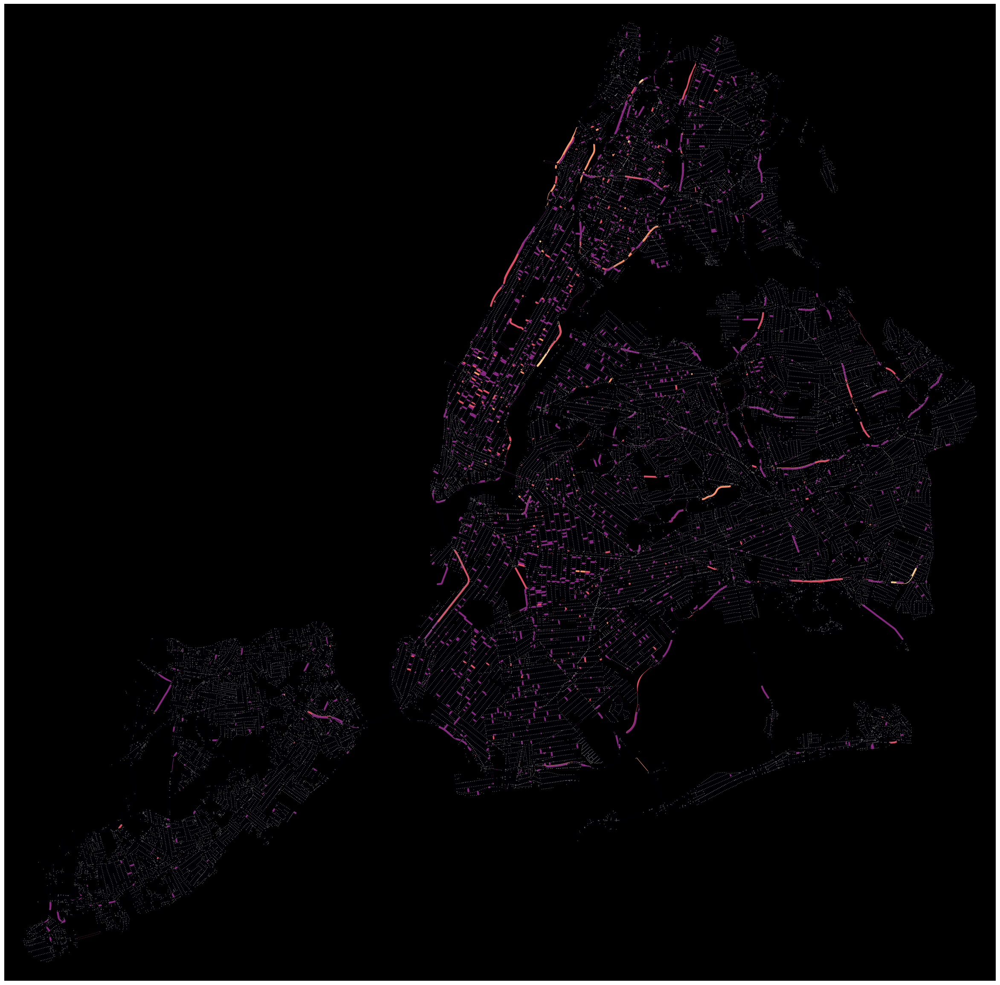

In [39]:
edges['normalized crashes'] = normalized_crashes

G = ox.graph_from_gdfs(nodes, edges)
ec = ox.plot.get_edge_colors_by_attr(G, attr = 'normalized crashes', cmap= 'magma')

fig, ax = ox.plot_graph(G, node_size=1, node_color = 'grey', edge_color=ec, edge_linewidth=3, figsize=(30,30), edge_alpha=1, bgcolor='black')

## Feature 4 - Fire Incidents

### Description
The Fire Incident Dispatch Data file contains data that is generated by the Starfire Computer Aided Dispatch System. The data spans from the time the incident is created in the system to the time the incident is closed in the system. It covers information about the incident as it relates to the assignment of resources and the Fire Department’s response to the emergency.
url = https://data.cityofnewyork.us/Public-Safety/Fire-Incident-Dispatch-Data/8m42-w767/about_data

### Load the dataset

In [40]:
url="https://raw.githubusercontent.com/hetal-bharwani/graphML/main/Emergency_Response_Incidents_20240522.csv"
Fire_incidents = pd.read_csv(url)
print(Fire_incidents.head())

                  Incident Type                       Location    Borough  \
0            Utility-Water Main               136-17 72 Avenue     Queens   
1  Structural-Sidewalk Collapse                   927 Broadway  Manhattan   
2                 Utility-Other                            NaN  Manhattan   
3          Administration-Other  Seagirt Blvd & Beach 9 Street     Queens   
4         Law Enforcement-Other                            NaN   Brooklyn   

            Creation Date Closed Date   Latitude  Longitude  
0  01/16/2017 01:13:38 PM         NaN  40.714004 -73.829989  
1  10/29/2016 12:13:31 PM         NaN  40.714422 -74.006076  
2  11/22/2016 08:53:17 AM         NaN        NaN        NaN  
3  11/14/2016 03:53:54 PM         NaN  40.714004 -73.829989  
4  10/29/2016 05:35:28 PM         NaN        NaN        NaN  


In [41]:
#Filter fire incidents
Fire_incidents = Fire_incidents[Fire_incidents['Incident Type'].str.contains("fire", case=False, na=False)]

# Count the number of each type of crash
type_counts = Fire_incidents['Incident Type'].value_counts()
print(type_counts)
len(Fire_incidents['Incident Type'].unique())

Incident Type
Fire-2nd Alarm                             1210
Fire-3rd Alarm                              520
Fire-1st Alarm                              444
Fire-5th Alarm                              313
Fire-4th Alarm                              283
Fire-Haz Mat                                208
Fire-10-76 (Commercial High Rise Fire)      162
Fire-Other                                  147
Fire-Manhole                                127
Fire-6th Alarm                              124
Fire-Collapse                               124
Fire-10-77 (Residential High Rise Fire)     111
Fire-Sensitive Location                      96
Fire-Explosion                               67
Fire-School                                  52
Fire-7th Alarm                               46
Fire-10-77 (Residential High Rise)           33
Fire-10-76 (Commercial High Rise)            31
Fire-Hospital                                29
Fire-8th Alarm                               21
Fire-Commercial           

56

In [42]:
def map_incident_degree(incident_type):
    if "1st Alarm" in incident_type:
        return '1D'
    elif "2nd Alarm" in incident_type or "Other" in incident_type or "Manhole" in incident_type or "Residential High Rise" in incident_type or "Commercial High Rise" in incident_type:
        return '2D'
    elif "3rd Alarm" in incident_type or "5th Alarm" in incident_type or "6th Alarm" in incident_type or "Explosion" in incident_type or "School" in incident_type or "Haz Mat" in incident_type or "Hospital" in incident_type:
        return '3D'
    elif "4th Alarm" in incident_type or "Collapse" in incident_type or "7th Alarm" in incident_type or "8th Alarm" in incident_type or "High Rise" in incident_type:
        return '4D'
    else:
        if "10-77" in incident_type:
            return '2D'
        else:
            if Fire_incidents['Incident Type'].value_counts()[incident_type] > 10:
                return '2D'
            else:
                return '1D'

# Apply the function to create the 'incident degree' column
Fire_incidents['Incident degree'] = Fire_incidents['Incident Type'].apply(map_incident_degree)

Fire_incidents['Incident degree'].value_counts()

Incident degree
2D    1949
3D    1313
1D     492
4D     482
Name: count, dtype: int64


In [49]:
geometry = gpd.points_from_xy(Fire_incidents['Longitude'], Fire_incidents['Latitude'])
fire_gdf_points = gpd.GeoDataFrame(Fire_incidents, geometry=geometry)
fire_gdf_points.set_crs(epsg=4326, inplace=True)

,Incident Type,Location,Borough,Creation Date,Closed Date,Latitude,Longitude,Incident degree,geometry
6,Fire-2nd Alarm,238 East 24 Street,Manhattan,11/25/2016 04:06:09 AM,NaN,40.714422,-74.006076,2D,POINT (-74.00608 40.71442)
8,Fire-10-76 (Commercial High Rise Fire),130 East 57 Street,Manhattan,11/26/2016 05:45:43 AM,NaN,NaN,NaN,2D,POINT EMPTY
10,Fire-2nd Alarm,24 Charles Street,Manhattan,12/14/2016 10:26:17 PM,NaN,40.714422,-74.006076,2D,POINT (-74.00608 40.71442)
11,Fire-3rd Alarm,581 3 ave,new york,11/30/2016 12:25:38 AM,11/30/2016 04:22:22 AM,40.667490,-73.994286,3D,POINT (-73.99429 40.66749)
14,Fire-2nd Alarm,53-09 Beach Channel Drive,Far Rockaway,12/18/2016 05:52:37 PM,NaN,40.595083,-73.784005,2D,POINT (-73.78401 40.59508)
...,...,...,...,...,...,...,...,...,...
11738,Fire-Other,NaN,Brooklyn,09/03/2015 03:30:43 AM,09/03/2015 03:30:43 AM,NaN,NaN,2D,POINT EMPTY
11740,Fire-2nd Alarm,NaN,Brooklyn,01/23/2016 01:34:29 AM,01/23/2016 04:20:06 AM,NaN,NaN,2D,POINT EMPTY
11743,Fire-10-77 (Residential High Rise Fire),72 Columbia Street,Manhattan,11/07/2016 12:40:50 PM,11/07/2016 12:49:16 PM,NaN,NaN,2D,POINT EMPTY
11745,Fire-1st Alarm,NaN,Brooklyn,11/07/2016 05:09:53 PM,11/07/2016 08:09:32 PM,NaN,NaN,1D,POINT EMPTY


### Plot dataset

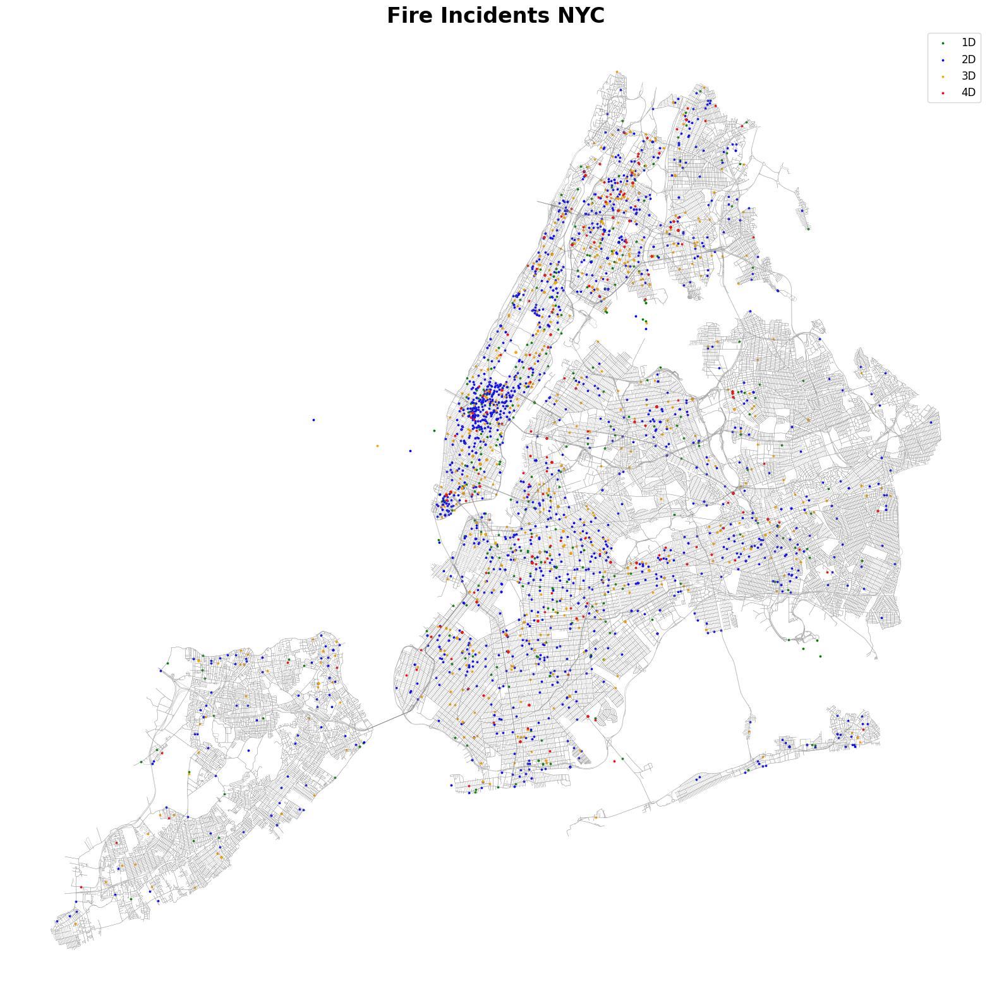

In [51]:
# Project the points to a projected coordinate system if necessary
fire_gdf_points["geometry"] = fire_gdf_points["geometry"].to_crs(pcs)

# Classify the fire incidents based on incident degree
fire_1D = fire_gdf_points[fire_gdf_points['Incident degree'] == '1D']
fire_2D = fire_gdf_points[fire_gdf_points['Incident degree'] == '2D']
fire_3D = fire_gdf_points[fire_gdf_points['Incident degree'] == '3D']
fire_4D = fire_gdf_points[fire_gdf_points['Incident degree'] == '4D']

# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))

# Plot filtered fire incidents
fire_1D.plot(ax=ax, color='green', markersize=3, label='1D')
fire_2D.plot(ax=ax, color='blue', markersize=3, label='2D')
fire_3D.plot(ax=ax, color='orange', markersize=3, label='3D')
fire_4D.plot(ax=ax, color='red', markersize=3, label='4D')

# Assuming you have edges and area as GeoDataFrames
edges.plot(ax=ax, linewidth=0.2, edgecolor='grey') # print edges


plt.title("Fire Incidents NYC", fontsize=24, fontweight='bold')
plt.axis('off')
plt.legend(fontsize='large')
plt.show()

In [ ]:
fire_gdf = fire_gdf[~fire_gdf['geometry'].is_empty]
fire_gdf = fire_gdf[~fire_gdf['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
fire_gdf.head()

,Incident Type,Location,Borough,Creation Date,Closed Date,Latitude,Longitude,incident degree,Incident degree,geometry
6,Fire-2nd Alarm,238 East 24 Street,Manhattan,11/25/2016 04:06:09 AM,NaN,40.714422,-74.006076,2D,2D,POINT (-74.00608 40.71442)
10,Fire-2nd Alarm,24 Charles Street,Manhattan,12/14/2016 10:26:17 PM,NaN,40.714422,-74.006076,2D,2D,POINT (-74.00608 40.71442)
11,Fire-3rd Alarm,581 3 ave,new york,11/30/2016 12:25:38 AM,11/30/2016 04:22:22 AM,40.667490,-73.994286,3D,3D,POINT (-73.99429 40.66749)
14,Fire-2nd Alarm,53-09 Beach Channel Drive,Far Rockaway,12/18/2016 05:52:37 PM,NaN,40.595083,-73.784005,2D,2D,POINT (-73.78401 40.59508)
15,Fire-1st Alarm,151 West 100 Street,Manhattan,12/23/2016 01:36:49 PM,NaN,40.714422,-74.006076,1D,1D,POINT (-74.00608 40.71442)


In [ ]:
print(len(fire_gdf))

3764


## Feature 5 - Traffic

https://www.dot.ny.gov/tdv

Annual Average Daily Traffic (AADT) and additional traffic statistics for a Traffic Station. The Route Network layer provides a visual representation of Traffic Station segments. The Traffic Station location points provide details for individual counts at the specific location of data collection.

- Vehicle volume, classification, and speed data
- Annual Average Daily Traffic (AADT)
- Truck AADT and Truck Percentage
- Location of historical short count sites

https://data.cityofnewyork.us/Transportation/Traffic-Volume-Counts/btm5-ppia/about_data

https://data.cityofnewyork.us/City-Government/LION/2v4z-66xt/about_data

New York City Department of Transportation (NYC DOT) uses Automated Traffic Recorders (ATR) to collect traffic sample volume counts at bridge crossings and roadways.

In [58]:
from geopy.geocoders import Nominatim
from shapely.geometry import LineString


# URL to the raw CSV file on GitHub
url = 'https://raw.githubusercontent.com/NaveenKumar-ar/GraphML_Repo/main/02-Datasets/Geo-Traffic%20data/Traffic_Volume_Counts_20240515.csv'

# Load the dataset from GitHub
data = pd.read_csv(url)

data=data.iloc[0:10000]
data.head()


,ID,SegmentID,Roadway Name,From,To,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,...,2:00-3:00PM,3:00-4:00PM,4:00-5:00PM,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM
0,1,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/09/2012,20.0,10.0,11.0,...,104.0,105.0,147.0,120.0,91.0,83.0,74.0,49.0,42.0,42.0
1,2,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/10/2012,21.0,16.0,8.0,...,102.0,98.0,133.0,131.0,95.0,73.0,70.0,63.0,42.0,35.0
2,3,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/11/2012,27.0,14.0,6.0,...,115.0,115.0,130.0,143.0,106.0,89.0,68.0,64.0,56.0,43.0
3,4,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/12/2012,22.0,7.0,7.0,...,71.0,127.0,122.0,144.0,122.0,76.0,64.0,58.0,64.0,43.0
4,5,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/13/2012,31.0,17.0,7.0,...,113.0,126.0,133.0,135.0,102.0,106.0,58.0,58.0,55.0,54.0


In [60]:
# Define time period lists (adjust as needed)
morning_hours = ['5:00-6:00AM', '6:00-7:00AM', '7:00-8:00AM', '8:00-9:00AM', '9:00-10:00AM', '10:00-11:00AM', '11:00-12:00PM']
afternoon_hours = ['12:00-1:00PM', '1:00-2:00PM', '2:00-3:00PM', '3:00-4:00PM', '4:00-5:00PM']
evening_hours = ['5:00-6:00PM', '6:00-7:00PM', '7:00-8:00PM', '8:00-9:00PM', '9:00-10:00PM', '10:00-11:00PM', '11:00-12:00AM']

# Calculate sum for each period
data['morning'] = data[morning_hours].sum(axis=1)
data['afternoon'] = data[afternoon_hours].sum(axis=1)
data['evening'] = data[evening_hours].sum(axis=1)

# Calculate total traffic
data['total_traffic'] = data[['morning', 'afternoon', 'evening']].sum(axis=1)

In [1]:
# Group by SegmentID, From, and To
grouped_data = data.groupby(['SegmentID', 'From', 'To'])

# Calculate average traffic for each period (using group size)
grouped_data = grouped_data.agg({
    'morning': 'mean',
    'afternoon': 'mean',
    'evening': 'mean',
    'total_traffic': 'mean'  # Calculate average total traffic within the group
})

aggregated_data=grouped_data.copy()
print(aggregated_data.head())


NameError: name 'data' is not defined

In [62]:
# Initialize a geocoder
geolocator = Nominatim(user_agent="my_geocoder")

# Function to geocode an address to coordinates
def geocode_address(address):
    try:
        location = geolocator.geocode(address)
        return (location.latitude, location.longitude)
    except:
        return None

# Assuming you have a DataFrame named 'aggregated_data' with 'From' and 'To' columns
# Geocode the 'From' and 'To' columns
aggregated_data['from_coords'] = aggregated_data['From'].apply(geocode_address)
aggregated_data['to_coords'] = aggregated_data['To'].apply(geocode_address)

# Drop rows with missing coordinates
aggregated_data = aggregated_data.dropna(subset=['from_coords', 'to_coords'])

# Function to calculate the midpoint
def calculate_midpoint(from_coords, to_coords):
    return ((from_coords[0] + to_coords[0]) / 2, (from_coords[1] + to_coords[1]) / 2)

# Calculate the midpoint coordinates
aggregated_data['midpoint_coords'] = aggregated_data.apply(lambda row: calculate_midpoint(row['from_coords'], row['to_coords']), axis=1)

# Create Point objects from the midpoint coordinates
aggregated_data['geometry'] = aggregated_data['midpoint_coords'].apply(lambda coords: Point(coords))

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(aggregated_data, geometry='geometry')

# Display the GeoDataFrame
gdf


: 

In [36]:
# #Project the points to a projected coordinate system
# traffic_gdf_points["geometry"]= traffic_gdf_points["geometry"].to_crs(pcs)

# # Plot the base graph
# fig, ax = plt.subplots(figsize=(20, 20))
# area.plot(ax = ax, facecolor = 'White')
# nodes.plot(ax= ax, color = 'White', markersize = 0.1)

# # Plot the street segments on top of the map
# traffic_gdf_points.plot(ax=ax, color='red', linewidth=0.1)

# # Show the plot
# plt.show()

ValueError: Cannot transform naive geometries.  Please set a crs on the object first.

### 05

In [1]:
osm_crs=G.graph["crs"]  #coordinate system
osm_crs

NameError: name 'G' is not defined

In [ ]:
ac_streets=ox.projection.project_gdf(ac_streets, to_crs=osm_crs, to_latlong=False) #https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.projection.project_gdf
ac_streets  #after projection -> this is an edges geodataframe that has information about the geometry

In [ ]:
url_traffic = "https://raw.githubusercontent.com/ManolyaLN/GraphML_Repo/Manolya/02-Datasets/Traffic_Volume_Counts_20240524.csv"
urllib.request.urlretrieve(url_traffic, 'nyc_traffic_volume_counts.csv')

In [ ]:
ftraffic = pd.read_csv('nyc_traffic_volume_counts.csv')

In [ ]:
print(df_traffic.head())

In [ ]:
print(df_traffic.dtypes)

In [31]:
traffic_df = pd.read_csv("https://raw.githubusercontent.com/ManolyaLN/GraphML_Repo/Manolya/02-Datasets/points_with_community.csv")

In [32]:
geometry = [Point(xy) for xy in zip(traffic_df.longitude, traffic_df.latitude)]

In [35]:
gdf = gpd.GeoDataFrame(traffic_df, geometry=geometry)

1000

In [34]:
print(gdf.head())

    latitude  longitude  sub-district  traffic_density  \
0  40.684791 -74.021912          24.0        90.978964   
1  40.685139 -74.021137          24.0        90.978964   
2  40.685550 -74.020236          24.0        90.978964   
3  40.685824 -74.025872          24.0        90.978964   
4  40.685994 -74.025888          24.0        90.978964   

                     geometry  
0  POINT (-74.02191 40.68479)  
1  POINT (-74.02114 40.68514)  
2  POINT (-74.02024 40.68555)  
3  POINT (-74.02587 40.68582)  
4  POINT (-74.02589 40.68599)  


In [ ]:
gdf.set_crs(epsg=4326, inplace=True)

,latitude,longitude,sub-district,traffic_density,geometry
0,40.684791,-74.021912,24.0,90.978964,POINT (-74.02191 40.68479)
1,40.685139,-74.021137,24.0,90.978964,POINT (-74.02114 40.68514)
2,40.685550,-74.020236,24.0,90.978964,POINT (-74.02024 40.68555)
3,40.685824,-74.025872,24.0,90.978964,POINT (-74.02587 40.68582)
4,40.685994,-74.025888,24.0,90.978964,POINT (-74.02589 40.68599)
...,...,...,...,...,...
995,40.871043,-73.915746,4.0,527.553424,POINT (-73.91575 40.87104)
996,40.871161,-73.914010,4.0,31.511706,POINT (-73.91401 40.87116)
997,40.871655,-73.911227,4.0,31.511706,POINT (-73.91123 40.87166)
998,40.873237,-73.911515,4.0,31.511706,POINT (-73.91152 40.87324)


In [ ]:
gdf.to_file("output_file.gpkg", driver="GPKG")

In [ ]:
url = "https://github.com/ManolyaLN/GraphML_Repo/raw/Manolya/02-Datasets/output_file.gpkg"
urllib.request.urlretrieve(url, 'file_1.gpkg')
url_p1='/content/file_1.gpkg'

In [ ]:
points_gdf = gpd.read_file(url)

In [ ]:
print("Columns in the GeoDataFrame:")
print(points_gdf.columns)

In [ ]:
print("Original CRS:", points_gdf.crs)

In [ ]:
pcs = "EPSG:2263"  # NAD83 / New York Long Island

In [ ]:
points_gdf = points_gdf.to_crs(pcs)

In [ ]:
print("Columns in the GeoDataFrame:")
print(points_gdf.columns)

In [ ]:
polygons_list = []

In [ ]:
for name, group in points_gdf.groupby('sub-district'):
    # Create a MultiPoint object from the group
    multipoint = MultiPoint(group.geometry.tolist())
    # Create a convex hull polygon from the MultiPoint object
    polygon = multipoint.convex_hull
    # Create a dictionary with sub_district, traffic_density, and geometry
    polygon_dict = {
        'sub-district': name,
        'traffic_density': group['traffic_density'].mean(),  # Calculate average traffic density
        'geometry': polygon
    }
    polygons_list.append(polygon_dict)

In [ ]:
polygons_gdf = gpd.GeoDataFrame(polygons_list, crs=points_gdf.crs)

In [ ]:
print(polygons_gdf.head())
polygons_gdf.plot(column='traffic_density', legend=True)
plt.axis("off")
plt.title("Traffic Density by Sub-District", fontsize=10)
plt.show()

## All Features with Graph


### Assign to nearest nodes

In [45]:
nodes

,y,x,ref,highway,street_count,lon,lat,geometry
osmid,,,,,,,,
39076461,40.786409,-73.794627,33,motorway_junction,3,-73.794627,40.786409,POINT (-73.79463 40.78641)
42854803,40.787159,-73.791931,NaN,traffic_signals,3,-73.791931,40.787159,POINT (-73.79193 40.78716)
274283981,40.789305,-73.786423,NaN,NaN,3,-73.786423,40.789305,POINT (-73.78642 40.78930)
39076490,40.762429,-73.757091,31W,motorway_junction,3,-73.757091,40.762429,POINT (-73.75709 40.76243)
277672046,40.762371,-73.756729,NaN,NaN,3,-73.756729,40.762371,POINT (-73.75673 40.76237)
...,...,...,...,...,...,...,...,...
11835787250,40.673081,-73.758639,NaN,NaN,3,-73.758639,40.673081,POINT (-73.75864 40.67308)
11892293873,40.731096,-73.727660,NaN,NaN,1,-73.727660,40.731096,POINT (-73.72766 40.73110)
11892293874,40.731082,-73.727219,NaN,NaN,3,-73.727219,40.731082,POINT (-73.72722 40.73108)


In [46]:
#Spatial Index
from shapely.geometry import Point

#Convert the graph nodes to shapely points
Points_from_Nodes = gpd.GeoSeries(gpd.points_from_xy(list(nodes['x']),list(nodes['y'])))

#Create a dictionary where {key:value} = {Point spatialIndex : Node osmid}
nodes_osmid=list(nodes.index)                      #list of nodes indicies in osmnx graph
Points_spatialindex=list(Points_from_Nodes.index)  #list of  spatial indicies of the created points

osmId_spatialIndex={}

[osmId_spatialIndex.update({i:j}) for i,j in zip(Points_spatialindex,nodes_osmid)]

len(nodes_osmid) 

55332

In [128]:
#Create shapely points from polygons centroids
nodes01= ngdf_pts['geometry'].centroid
nodes02= crime_gdf_points['geometry'].centroid
nodes03= crashes_gdf_points['geometry'].centroid
nodes04= fire_gdf_points['geometry'].centroid
#polygon_05_c_to_points= traffic_gdf_points['geometry'].centroid

C:\Users\pingn\AppData\Local\Temp\ipykernel_17240\4064966638.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nodes01= ngdf_pts['geometry'].centroid
C:\Users\pingn\AppData\Local\Temp\ipykernel_17240\4064966638.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nodes02= crime_gdf_points['geometry'].centroid
C:\Users\pingn\AppData\Local\Temp\ipykernel_17240\4064966638.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nodes03= crashes_gdf_points['geometry'].centroid
C:\Users\pingn\AppData\Local\Temp\ipykernel_17240\4064966638.py:5: UserWarning: Geometry is in a geogra

In [129]:
nearest_points_spatial_index_01 = Points_from_Nodes.sindex.nearest(nodes01,return_all=False,return_distance=False)

nearest_points_spatial_index_01 = nearest_points_spatial_index_01[1].tolist() #[1] the indicies of the nodes_points, whereas [0] the indicies of the polygons centroid points
print(f'graph nodes spatial index{nearest_points_spatial_index_01}')
len(nearest_points_spatial_index_01)

graph nodes spatial index[21392, 54389, 53980, 20881, 52655, 53648, 1136, 673, 3977, 1724, 1350, 28555, 16570, 50713, 20147, 15466, 15466, 42821, 44062, 45991, 42713, 45364, 46429, 46429, 48891, 48891, 47589, 47199, 47199, 45364, 42713, 44323, 44323, 45839, 45839, 44062, 45991, 43136, 41642, 17964, 17964, 21649, 16849, 16570, 15406, 36072, 33019, 32810, 33494, 30923, 22714, 22409, 33695, 29162, 29708, 27788, 30563, 4757, 5982, 14348, 12760, 52452, 22657, 22657, 8639, 12475, 8946, 4372, 12627, 7809, 13053, 11304, 14220, 9816, 6736, 12243, 9475, 4194, 55204, 54037, 36086, 39594, 27788, 30371, 39206, 29162, 24206, 24048, 28359, 41252, 35842, 33494, 23021, 22409, 30923, 33695, 29922, 40562, 29708, 22714, 30563, 23021, 30179, 39964, 50909, 37151, 36086, 36072, 28359, 24048, 54037, 30371, 39594, 36229, 25904, 31551, 36229, 87, 3348, 3017, 898, 1496, 3465, 11937, 7724, 13391, 10141, 9774, 14064, 10475, 6064, 13926, 14348, 10475, 12760, 9774, 14220, 13548, 5982, 13391, 4757, 7724, 4155, 12627,

525

In [130]:
#Relate back to osmid
nearest_graph_nodes_01=[osmId_spatialIndex[i] for i in nearest_points_spatial_index_01]
len(nearest_graph_nodes_01) #same number of the polygons centroids

525

In [120]:
#Find nearest points
nearest_points_spatial_index_02=Points_from_Nodes.sindex.nearest(nodes02,return_all=False,return_distance=False) #return_all=False if True, might return more than 1 point if there are equale distance-data structure'll change but more accurate
print(f'centroids and graph nodes spatial index{nearest_points_spatial_index_02}')
nearest_points_spatial_index_02=nearest_points_spatial_index_02[1].tolist() #[1] the indicies of the nodes_points, whereas [0] the indicies of the polygons centroid points
print(f'graph nodes spatial index{nearest_points_spatial_index_02}')
len(nearest_points_spatial_index_02)

centroids and graph nodes spatial index[[     0      1      2 ... 137267 137268 137269]
 [ 10785  19867  35185 ...  37881  27649  37362]]
graph nodes spatial index[10785, 19867, 35185, 11861, 2243, 44320, 48610, 18487, 12424, 6883, 29728, 775, 2927, 9642, 47350, 812, 50539, 13965, 9249, 3128, 41942, 47584, 12774, 10703, 46370, 44498, 1753, 3243, 12230, 41978, 463, 6779, 5539, 48769, 9831, 822, 2852, 4045, 2569, 10899, 47369, 42092, 45922, 3783, 1788, 1214, 2431, 2578, 1914, 5425, 1750, 10271, 43296, 43133, 42678, 1197, 159, 1322, 50305, 51399, 2564, 7821, 3745, 12977, 1443, 2870, 48420, 923, 500, 5002, 12975, 6775, 50234, 1445, 1618, 11857, 2399, 54132, 50013, 1638, 47658, 55204, 9193, 45928, 1448, 1233, 7020, 4208, 3839, 2578, 43681, 5708, 52452, 847, 5649, 4640, 42806, 13972, 44350, 45353, 6113, 7759, 57, 882, 5880, 2568, 876, 7938, 10925, 46964, 48081, 519, 14913, 756, 12893, 47146, 15159, 47422, 44652, 1521, 3463, 343, 3653, 3236, 2587, 7825, 44556, 248, 15272, 4510, 3829, 1336, 41

137268

In [121]:
#Relte back to osmid
nearest_graph_nodes_02=[osmId_spatialIndex[i] for i in nearest_points_spatial_index_02]
len(nearest_graph_nodes_02) #same number of the polygons centroids

137268

In [122]:
#Find nearest points
nearest_points_spatial_index_03=Points_from_Nodes.sindex.nearest(nodes03,return_all=False,return_distance=False) #return_all=False if True, might return more than 1 point if there are equale distance-data structure'll change but more accurate
print(f'centroids and graph nodes spatial index{nearest_points_spatial_index_03}')
nearest_points_spatial_index_03=nearest_points_spatial_index_03[1].tolist() #[1] the indicies of the nodes_points, whereas [0] the indicies of the polygons centroid points
print(f'graph nodes spatial index{nearest_points_spatial_index_03}')
len(nearest_points_spatial_index_03)          #same as polygons_03

centroids and graph nodes spatial index[[    0     2     3 ...  5138  5139  5140]
 [17522 19670 16301 ... 18845 19002 17560]]
graph nodes spatial index[17522, 19670, 16301, 17763, 18238, 18968, 21486, 21738, 18203, 18570, 17214, 20546, 18074, 16178, 21262, 50580, 18184, 18481, 21748, 18272, 20607, 18115, 21185, 17903, 17604, 54537, 21938, 16140, 21225, 18660, 20492, 15636, 20572, 17668, 19788, 17486, 15681, 21317, 17462, 21938, 51890, 15410, 22063, 16056, 18155, 20695, 50441, 52060, 16094, 19340, 19637, 17069, 17649, 17404, 50567, 21928, 19638, 18270, 21179, 18152, 15882, 21736, 20800, 18820, 15779, 19909, 20918, 19741, 17001, 16136, 17630, 17044, 18226, 53480, 20303, 17938, 16839, 19573, 18280, 19034, 20145, 21412, 17078, 16446, 18487, 19286, 18171, 17478, 18641, 19182, 22249, 15879, 15509, 54546, 20814, 20422, 18205, 17933, 20005, 17523, 18267, 20402, 21674, 19825, 15708, 18149, 50578, 16178, 17333, 17336, 14997, 14486, 11054, 13533, 9317, 9193, 10628, 6235, 11262, 11239, 4697, 5093,

4402

In [114]:
#Relate back to osmid
nearest_graph_nodes_03=[osmId_spatialIndex[i] for i in nearest_points_spatial_index_03]
len(nearest_graph_nodes_03) #same number of the polygons centroids

4402

In [115]:
#Find nearest points
nearest_points_spatial_index_04=Points_from_Nodes.sindex.nearest(nodes04,return_all=False,return_distance=False) #return_all=False if True, might return more than 1 point if there are equale distance-data structure'll change but more accurate 
print(f'centroids and graph nodes spatial index{nearest_points_spatial_index_04}')
nearest_points_spatial_index_04=nearest_points_spatial_index_04[1].tolist() #[1] the indicies of the nodes_points, whereas [0] the indicies of the polygons centroid points
print(f'graph nodes spatial index{nearest_points_spatial_index_04}')
len(nearest_points_spatial_index_04)          #same as polygons_04

centroids and graph nodes spatial index[[   0    2    3 ... 4217 4230 4235]
 [ 826  826 5440 ... 3043  851 2231]]
graph nodes spatial index[826, 826, 5440, 31394, 826, 7495, 826, 826, 11214, 42828, 872, 11214, 51060, 51060, 4158, 51060, 872, 51060, 21336, 872, 16203, 21673, 826, 10031, 872, 7453, 9552, 9552, 9552, 47421, 51060, 5457, 826, 15699, 18165, 826, 826, 51060, 43232, 51060, 19131, 43232, 51060, 51060, 7453, 9552, 826, 21336, 21336, 9552, 7453, 9552, 7453, 826, 16395, 826, 826, 1184, 826, 51060, 9552, 51060, 826, 9552, 826, 7087, 51060, 3623, 872, 7453, 7453, 19538, 7453, 17503, 17503, 22087, 826, 30632, 30632, 10618, 51060, 826, 17503, 17503, 11076, 51060, 51060, 51060, 51060, 826, 1184, 51060, 51060, 9552, 6477, 43232, 9254, 51060, 7453, 19131, 51060, 826, 2770, 18840, 7453, 30632, 30632, 51060, 18840, 826, 826, 3793, 7725, 7453, 51060, 51060, 826, 26888, 796, 7453, 47421, 872, 20087, 7453, 9552, 12860, 796, 12860, 29331, 826, 51060, 13026, 51060, 5071, 79, 5071, 5071, 40564,

3764

In [116]:
#Relate back to osmid
nearest_graph_nodes_04=[osmId_spatialIndex[i] for i in nearest_points_spatial_index_04]
len(nearest_graph_nodes_04) #same number of the polygons centroids

3764

### Process Data

#### Dataset 01

In [137]:
# Create the refined dataset "E_buildings" with selected columns
columns = ['geometry', 'amenity', 'name', 'addr:city', 'addr:street', 'emergency']
E_buildings = ngdf_pts[columns]

# Display the refined dataset
print(E_buildings.head())

                                          geometry   amenity  \
element_type osmid                                             
node         357571909  POINT (-73.87984 40.88009)  hospital   
             357607640  POINT (-73.83883 40.84647)  hospital   
             357607688  POINT (-73.93226 40.78653)  hospital   
             357611253  POINT (-73.88140 40.88036)  hospital   
             357616245  POINT (-73.92791 40.78515)  hospital   

                                                                     name  \
element_type osmid                                                          
node         357571909  Montefiore Medical Center West Campus Moses Di...   
             357607640       New York City Children's Center Bronx Campus   
             357607688                  Kirby Forensic Psychiatric Center   
             357611253                       North Central Bronx Hospital   
             357616245               George Rosenfeld Center for Recovery   

           

In [140]:
# #Create a dictionary where {key:value} = {Point spatialIndex : Node osmid}
# nodes_osmid=list(nodes.index)                      #list of nodes indicies in osmnx graph
# Points_spatialindex=list(Points_from_Nodes.index)  #list of  spatial indicies of the created points

# osmId_spatialIndex={}
# [osmId_spatialIndex.update({i:j}) for i,j in zip(Points_spatialindex ,nodes_osmid)]
# len(nodes_osmid)

In [141]:
E_buildings['amenity']
list(E_buildings.amenity.unique()) 

['hospital', 'fire_station', 'police']

In [147]:
Proccessed_E_buildings=[]
for i in E_buildings['amenity']:
    if i=='fire_station':
        Proccessed_E_buildings.append('NY-FD')
    elif i=='police':
        Proccessed_E_buildings.append('NY-PD')
    elif i=='hospital':
        Proccessed_E_buildings.append('EMS')

E_buildings['emergency_type']=Proccessed_E_buildings
unique_emergency=list(E_buildings.emergency_type.unique())
E_buildings['emergency_type'].value_counts()

C:\Users\pingn\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\geopandas\geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


emergency_type
NY-FD    301
NY-PD    117
EMS      107
Name: count, dtype: int64

#### Dataset 02

In [160]:
crime_gdf_points = crime_gdf_points[~crime_gdf_points['geometry'].is_empty]
crime_gdf_points = crime_gdf_points[~crime_gdf_points['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
# crime_gdf_points.head()

In [164]:
# Create a dictionary to map 'LAW_CAT_CD' values to 'crime' values
crime_map = {'FELONY': 1, 'MISDEMEANOR': 2, 'VIOLATION': 3}

# Add a new column 'crime' based on 'LAW_CAT_CD'
crime_gdf['crimes'] = crime_gdf['LAW_CAT_CD'].map(crime_map)

# Check the counts crime types
crime_gdf['crimes'].value_counts()

crimes
2    71760
1    44453
3    21057
Name: count, dtype: int64

#### Dataset 03
Already the data has been processed

In [168]:
# Count the number of each type of crash
crashes_gdf_points['Type of crash'].value_counts()

Type of crash
2C    4714
3C     415
1C      12
Name: count, dtype: int64

#### Datset 04

Already the data has been processed

In [170]:
# Count the number of each type of fire incident
Fire_incidents['Incident degree'].value_counts()

Incident degree
2D    1949
3D    1313
1D     492
4D     482
Name: count, dtype: int64

#### Dataset 05
Traffic data_ taking time to Generate 🤔

## ff

# Check Correlation

In [ ]:
pip install phik

In [ ]:
import phik
from phik.report import plot_correlation_matrix
from phik import report
import seaborn as sns
import warnings

In [ ]:
attributes_to_check = ['attributes_01_0', 'attributes_01_1', 'attributes_01_2', 'attributes_01_3', 'attributes_02', 'attributes_03_0', 'attributes_03_1', 'attributes_03_2']
data_to_check = nodes[attributes_to_check]

In [ ]:
warnings.filterwarnings("ignore")

plt.figure(figsize=(10, 5))
heatmap = sns.heatmap(data_to_check.phik_matrix(), annot=True);
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

# Assigning Classes

Describe what will be your classification criteria --

Load dataset or alternative data strategy

Assign classes to node/edges

Plot classes with graph

# DGL Graph

Include features and classes as attributes to the city Graph

Convert networkx graph to DGL graph

Add features to DGL graph

In [ ]:
#Get dgl graph
graph=dgl.from_networkx(G, node_attrs=nodes_attributes_list)

In [ ]:
graph

In [ ]:
graph.ndata